# Supplementary - Dynamics

Contains analyses related to Supplementary Figure S2.

In [38]:
import sys
sys.path.append("..")

from main import *
from visualization import *

plt.rcParams['font.size'] = 18

if torch.cuda.is_available():  
    device = "cuda:0" 
else:  
    device = "cpu" 
    
print(device)

cuda:0


# Part 1: Inspecting the different dynamics - EDR model

Here we integrate 5 different dynamical models in the ellipsoid geometry, display some exemple dynamics, and compute their eigenmode-gradient correlations, just for visualization purposes.

In [39]:
vertices = np.load('../Files/vertices_ellipse.npy').astype('float')
eigenmodes = np.load('../Files/eigenmodes_ellipse.npy')

ellipse = Geometry(vertices, eigenmodes)

# Dynamics #1: Standard $\tanh$ activation function

In [168]:
params = {'N_neurons': 2500,
          'h': 0.1,
          'gamma': 27.5,
          'g': 5,
          'tau': 3,
          'dale': False,
          'rule': 'EDR'
          }

simulator = Simulator(ellipse,
                      ChaoticRNN,
                      params)

simulator.integrate(1000, output=False)

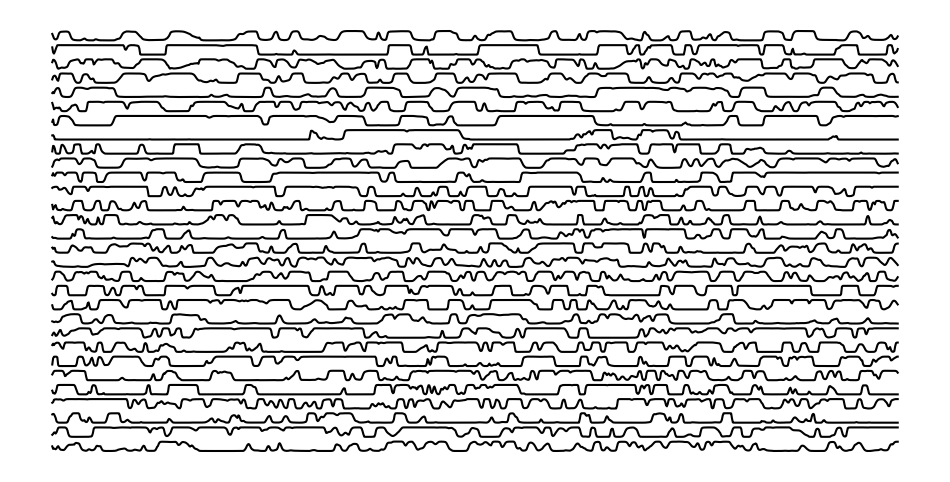

In [169]:
%matplotlib inline
simulator.plot(spacing=1.5)

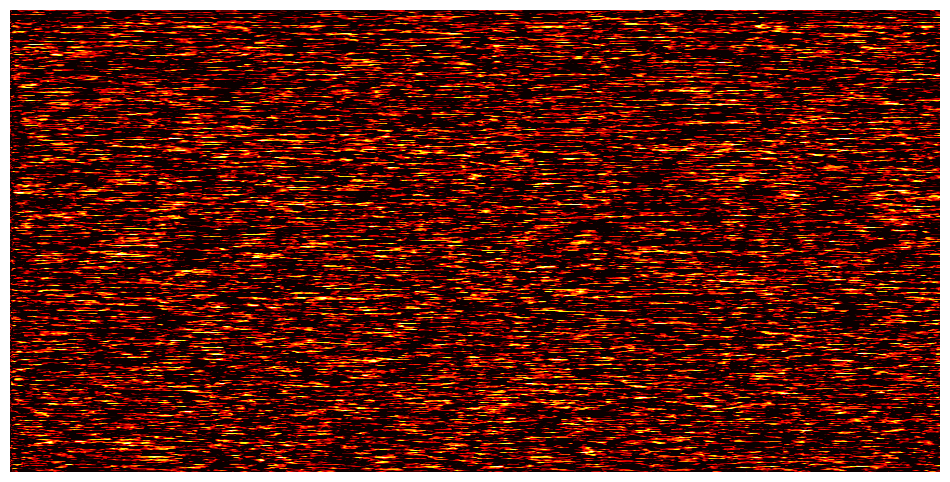

In [170]:
%matplotlib inline
simulator.imshow(vmin=0, vmax=1)

In [171]:
save = False
if save:
    np.save('../Results/supp_dynamics_timeseries_dynamics1.npy', simulator.timeseries)

In [172]:
%matplotlib qt
simulator.animate(alpha=1,
                  cmap='hot',
                  vmin=np.min(simulator.timeseries),
                  vmax=np.max(simulator.timeseries) * 1.75,
                  fps=50)

simulator.save_animation('../Figures/model1.gif', fps=50)

In [62]:
C = simulator.compute_average_correlations(n_iters=50, T=1000)

100%|███████████████████████████████████████████| 50/50 [00:18<00:00,  2.66it/s]


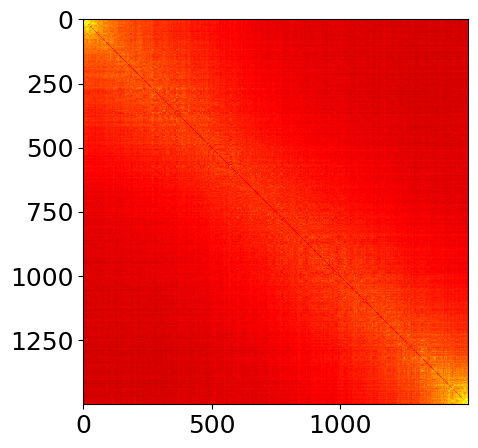

In [63]:
%matplotlib inline
plt.figure(figsize=(5, 5))
plt.imshow(C, cmap='hot', vmin=0, vmax=0.3)

In [64]:
mode_similarity, mapping = simulator.compute_geometric_mapping(C, N_modes=20)

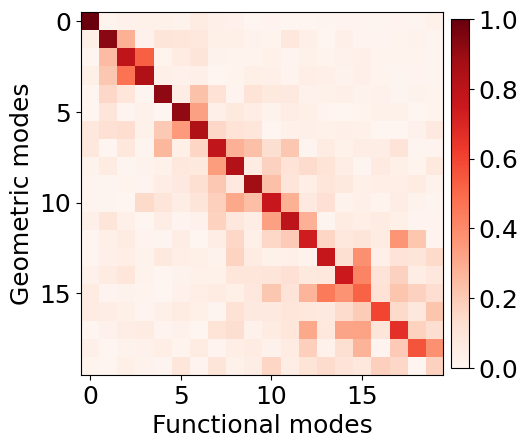

In [65]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(5, 5))
cax = plt.imshow(np.abs(mode_similarity), cmap='Reds', vmin=0, vmax=1)
plt.xlabel('Functional modes')
plt.ylabel('Geometric modes')
plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)

In [66]:
save = True
if save:
    np.save('../Results/supp_dynamics_correlations_dynamics1.npy', C)
    np.save('../Results/supp_dynamics_modesimilarity_dynamics1.npy', mode_similarity)

# Model #2: Generalized `Tanh` function

In [145]:
params = {'N_neurons': 2500,
          'h': 0.1,
          'g': 5,
          'tau': 3,
          'x_s': 0.1,
          'dale': True,
          'g_I': 1,
          'rule': 'EDR',
          'gamma': 27.5
          }

#np.random.seed(400)

simulator = Simulator(ellipse,
                      AdjustedChaoticRNN,
                      params)

#simulator.dynamics.W[simulator.dynamics.W < 0] *= 1.25

simulator.integrate(1000, output=False)

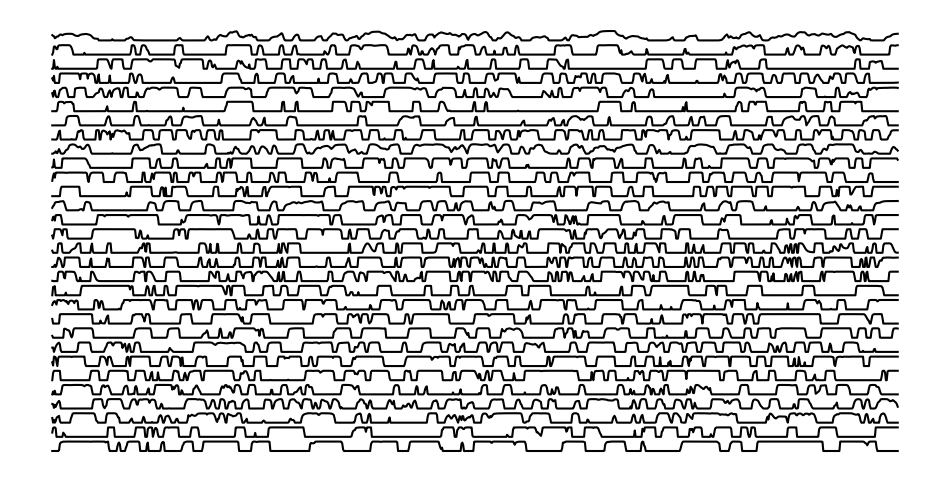

In [146]:
%matplotlib inline
simulator.plot(spacing=1.5)

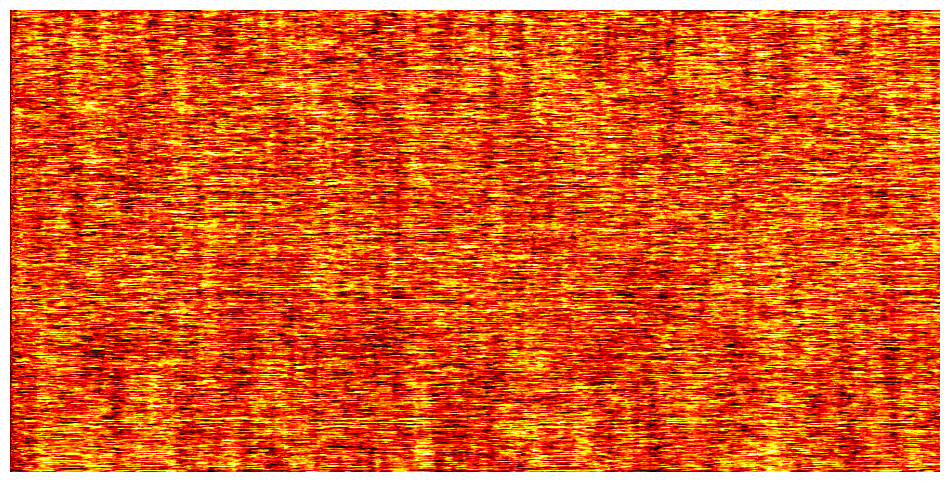

In [147]:
%matplotlib inline
simulator.imshow()

In [148]:
save = False
if save:
    np.save('../Results/supp_dynamics_timeseries_dynamics2.npy', simulator.timeseries)

In [154]:
%matplotlib qt
simulator.animate(alpha=1,
                  cmap='hot',
                  vmin=np.min(simulator.timeseries),
                  vmax=np.max(simulator.timeseries) * 1.75,
                  fps=50)

simulator.save_animation('../Figures/model2.gif', fps=50)

In [96]:
C = simulator.compute_average_correlations(n_iters=50, T=1000)

  0%|                                                    | 0/50 [00:00<?, ?it/s]/home/anleg84/GitHub/geometric-networks/Notebooks/../main.py:633: RuntimeWarning: divide by zero encountered in scalar divide
  ratio = E / I
/home/anleg84/GitHub/geometric-networks/Notebooks/../main.py:633: RuntimeWarning: invalid value encountered in scalar divide
  ratio = E / I
100%|███████████████████████████████████████████| 50/50 [00:21<00:00,  2.31it/s]


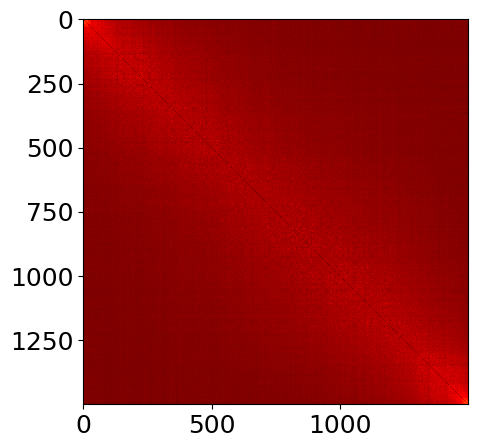

In [97]:
%matplotlib inline
plt.figure(figsize=(5, 5))
plt.imshow(C, cmap='hot')

In [98]:
mode_similarity, mapping = simulator.compute_geometric_mapping(C, N_modes=20)

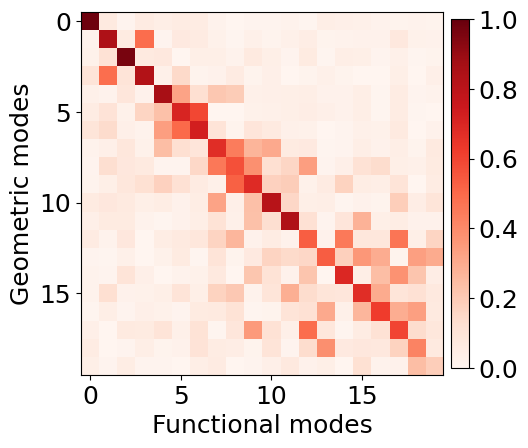

In [99]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(5, 5))
cax = plt.imshow(np.abs(mode_similarity), cmap='Reds', vmin=0, vmax=1)
plt.xlabel('Functional modes')
plt.ylabel('Geometric modes')
plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)

In [100]:
save = True
if save:
    np.save('../Results/supp_dynamics_correlations_dynamics2.npy', C)
    np.save('../Results/supp_dynamics_modesimilarity_dynamics2.npy', mode_similarity)

# Dynamics #3: Kuramoto-Sakaguchi model

In [182]:
params = {'N_neurons': 2500,
          'h': 0.1,
          'coupling': 4000,
          'tau': 20,
          'alpha': 50,
          'std': 0.1,
          'gamma': 27.5,
          'rule': 'EDR'
          }

#np.random.seed(420)

simulator = Simulator(ellipse,
                      KuramotoSakaguchi,
                      params)

simulator.integrate(1100, output=False)

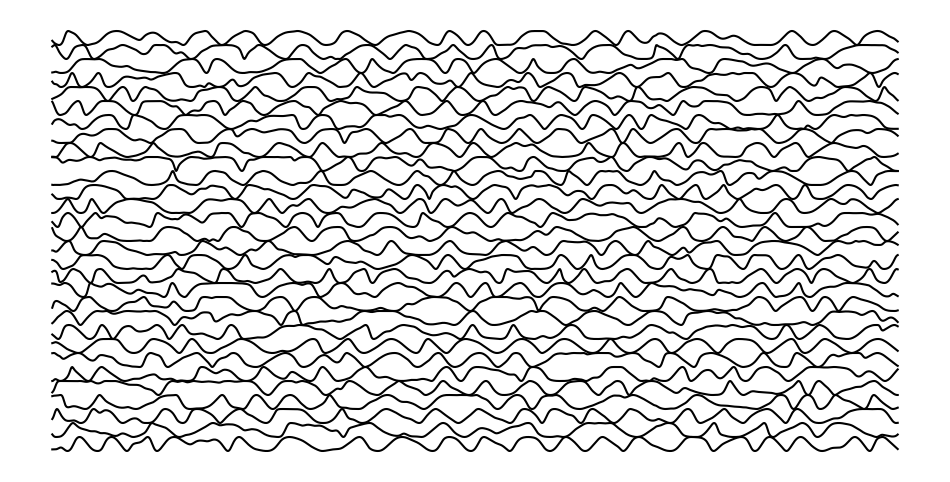

In [183]:
%matplotlib inline
simulator.plot(30, spacing=1)

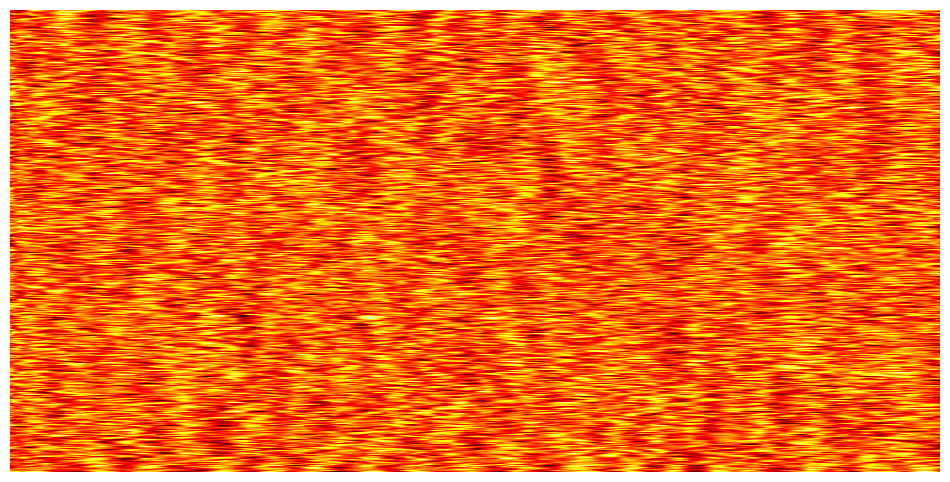

In [184]:
%matplotlib inline
simulator.imshow()

In [185]:
save = False
if save:
    np.save('../Results/supp_dynamics_timeseries_dynamics3.npy', simulator.timeseries)

In [187]:
%matplotlib qt
simulator.animate(alpha=1,
                  cmap='hot',
                  vmin=np.min(simulator.timeseries),
                  vmax=np.max(simulator.timeseries) * 1.75,
                  fps=50)

simulator.save_animation('../Figures/model3.gif', fps=50)

In [107]:
W_0 = numpify(simulator.dynamics.W)
C = simulator.compute_average_correlations(n_iters=50, T=1000)

100%|███████████████████████████████████████████| 50/50 [02:30<00:00,  3.02s/it]


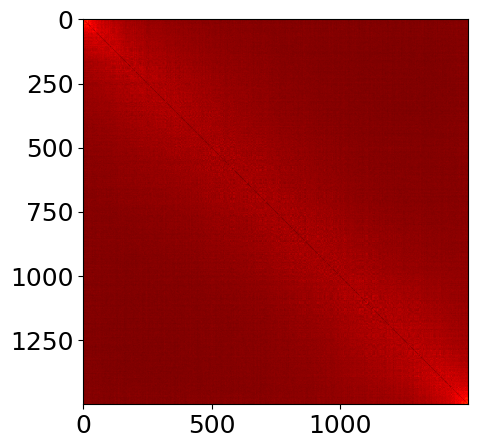

In [108]:
%matplotlib inline
plt.figure(figsize=(5, 5))
plt.imshow(C, cmap='hot')

In [109]:
mode_similarity, mapping = simulator.compute_geometric_mapping(C, N_modes=20)

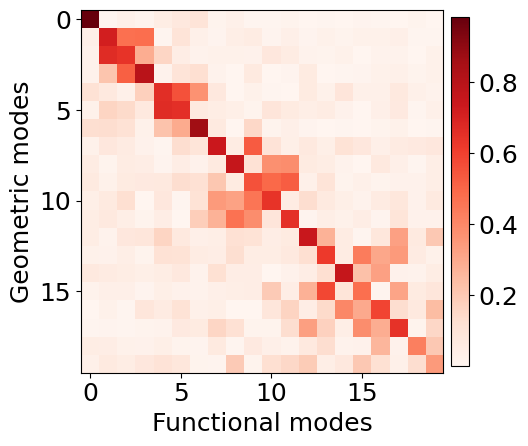

In [110]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(5, 5))
cax = plt.imshow(np.abs(mode_similarity), cmap='Reds')
plt.xlabel('Functional modes')
plt.ylabel('Geometric modes')
plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)

In [111]:
save = True
if save:
    np.save('../Results/supp_dynamics_correlations_dynamics3.npy', C)
    np.save('../Results/supp_dynamics_modesimilarity_dynamics3.npy', mode_similarity)

#### Sweeping `alpha` parameter

Doing a linear sweep of the `alpha` parameter to find a regime where eigenmodes and gradients are correlated to each other.

In [220]:
alpha_values = np.linspace(0, 200, 40, endpoint=True)

scores = []

for alpha in tqdm(alpha_values):

    params['alpha'] = alpha
    
    simulator = Simulator(ellipse,
                      KuramotoSakaguchi,
                      params)
    
    C = simulator.compute_average_correlations(n_iters=10, T=2500, verbose=False)
    mode_similarity, _ = simulator.compute_geometric_mapping(C, N_modes=20)

    scores.append(np.mean(np.abs(np.diag(mode_similarity))))

100%|███████████████████████████████████████████| 40/40 [21:56<00:00, 32.91s/it]


In [221]:
alpha_values[np.argmax(scores)]

51.282051282051285

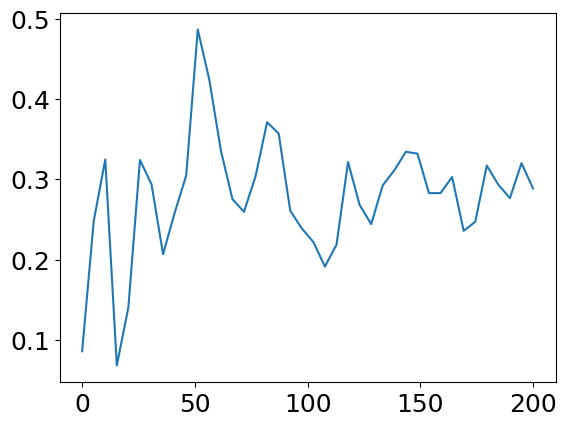

In [222]:
plt.plot(alpha_values, scores)

#### Sweeping coupling values

Doing a linear sweep of the coupling parameter to find a regime where eigenmodes and gradients are correlated to each other.

In [266]:
params['alpha'] = 0
coupling_values = np.linspace(0, 5000, 40, endpoint=True)

scores = []

for coupling in tqdm(coupling_values):

    params['coupling'] = coupling
    
    simulator = Simulator(ellipse,
                      KuramotoSakaguchi,
                      params)
    
    C = simulator.compute_average_correlations(n_iters=10, T=2500, verbose=False)
    mode_similarity, _ = simulator.compute_geometric_mapping(C, N_modes=20)

    scores.append(np.mean(np.abs(np.diag(mode_similarity))))

100%|███████████████████████████████████████████| 40/40 [21:31<00:00, 32.28s/it]


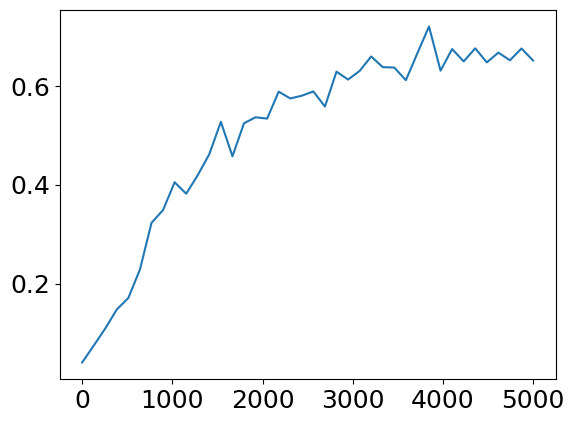

In [267]:
plt.plot(coupling_values, scores)

# Dynamics #4: Binary neuron cascades

Discrete dynamical system similar to epidemic spreading.
- `P_activation`: Probability of becoming active/infected, proportional to the number of active/infected neighbors.
- `P_deactivation`: Probability of spontaneously becoming inactive/uninfected.

In [189]:
params = {'N_neurons': 2500,
          'h': 0.1,
          'P_activation': 0.18,
          'P_deactivation': 0.45,
          'rule': 'EDR',
          'gamma': 27.5
          }

#np.random.seed(210)

simulator = Simulator(ellipse,
                      BinaryNetwork,
                      params)

simulator.integrate(1000, output=False)

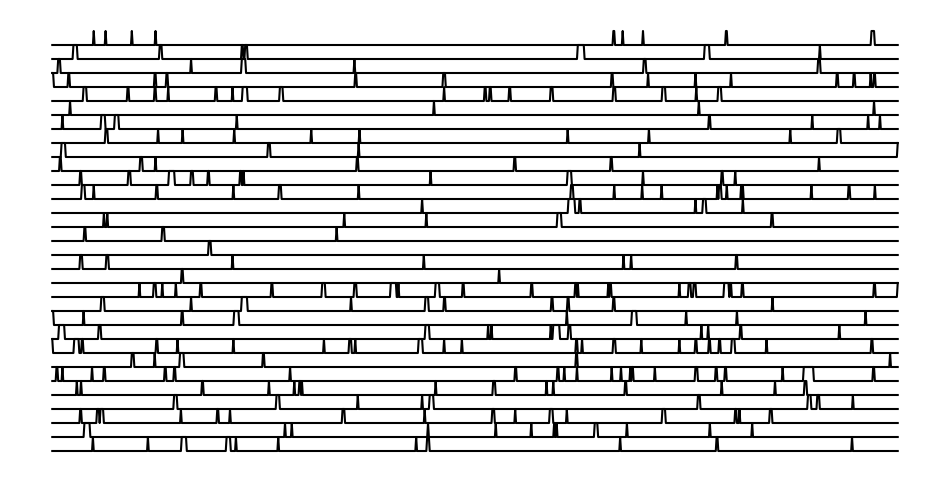

In [190]:
%matplotlib inline
simulator.plot(spacing=1)

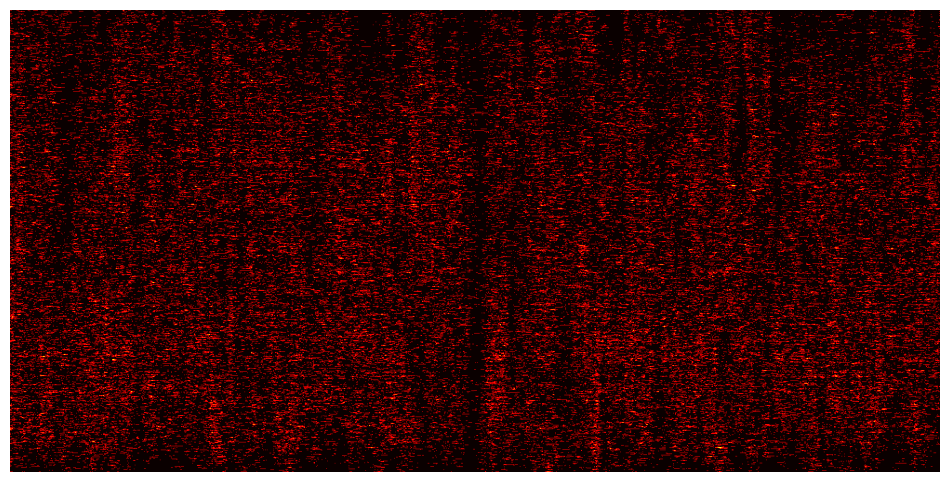

In [191]:
%matplotlib inline
simulator.imshow()

In [192]:
save = False
if save:
    np.save('../Results/supp_dynamics_timeseries_dynamics4.npy', simulator.timeseries)

In [193]:
%matplotlib qt
simulator.animate(alpha=1,
                  cmap='hot',
                  vmin=0,
                  vmax=1.5,
                  fps=50)

simulator.save_animation('../Figures/model4.gif', fps=50)

In [20]:
C = simulator.compute_average_correlations(n_iters=50, T=1100, cutoff=100)

100%|███████████████████████████████████████████| 50/50 [00:29<00:00,  1.68it/s]


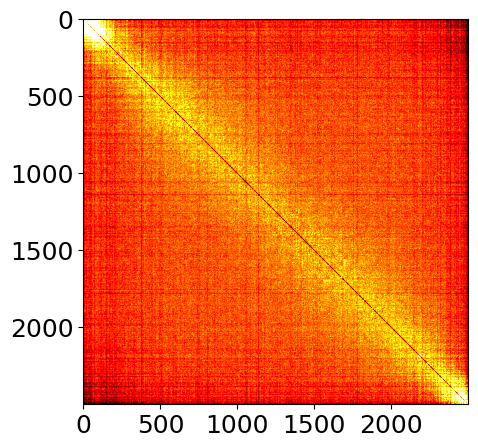

In [24]:
%matplotlib inline
plt.figure(figsize=(5, 5))
vmin, vmax = np.percentile(C, 10), np.percentile(C, 90)
plt.imshow(C, cmap='hot', vmin=vmin, vmax=vmax)

In [27]:
mode_similarity, mapping = simulator.compute_geometric_mapping(C, N_modes=20)

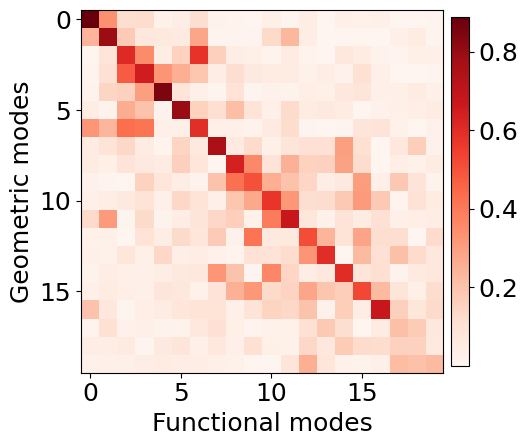

In [28]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(5, 5))
cax = plt.imshow(np.abs(mode_similarity), cmap='Reds')
plt.xlabel('Functional modes')
plt.ylabel('Geometric modes')
plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)

In [29]:
np.mean(np.abs(np.diag(mode_similarity)))

0.5903404668641274

In [30]:
save = True
if save:
    np.save('../Results/supp_dynamics_correlations_dynamics4.npy', C)
    np.save('../Results/supp_dynamics_modesimilarity_dynamics4.npy', mode_similarity)

# Dynamics #5: Spiking neural network

In [195]:
params = {'N_neurons': 2500,
         'h': 0.1,
         'gamma': 25,
         'g_L': 0.15,
         'E_L': -75,
         'E_E': -40,
         'E_I': -90,
         'V_thresh':-55,
         'V_reset':-75,
         'tau': 0.1,
         'I_E': 5,
         'I_I': 2.5,
         'sigma_E': 0,
         'sigma_I': 0,
         'delta_t': 0.04,
         'alpha': 2,
         'rule': 'EDR'
         }

simulator = Simulator(ellipse,
                      LIFNetwork,
                      params)

simulator.integrate(1100, output=False)

In [196]:
simulator.timeseries = gcampify(simulator.timeseries, tau=10)

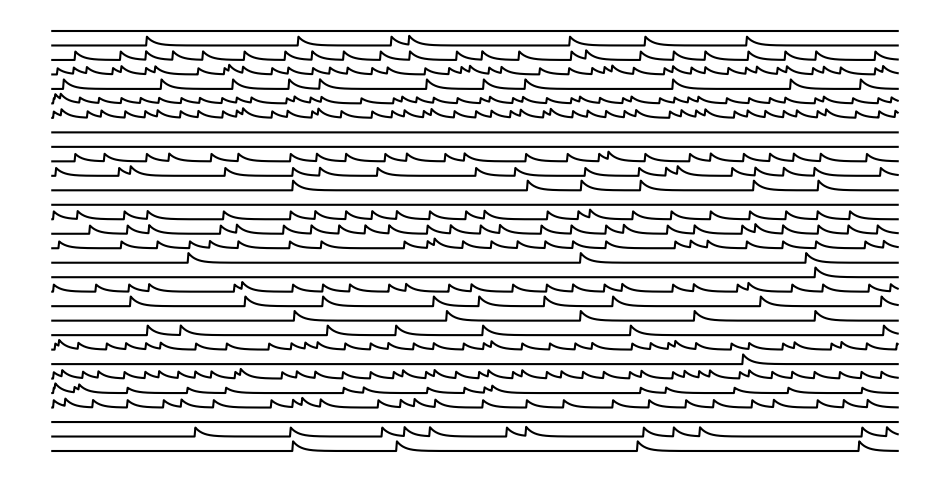

In [197]:
%matplotlib inline
simulator.plot(spacing=1.5)

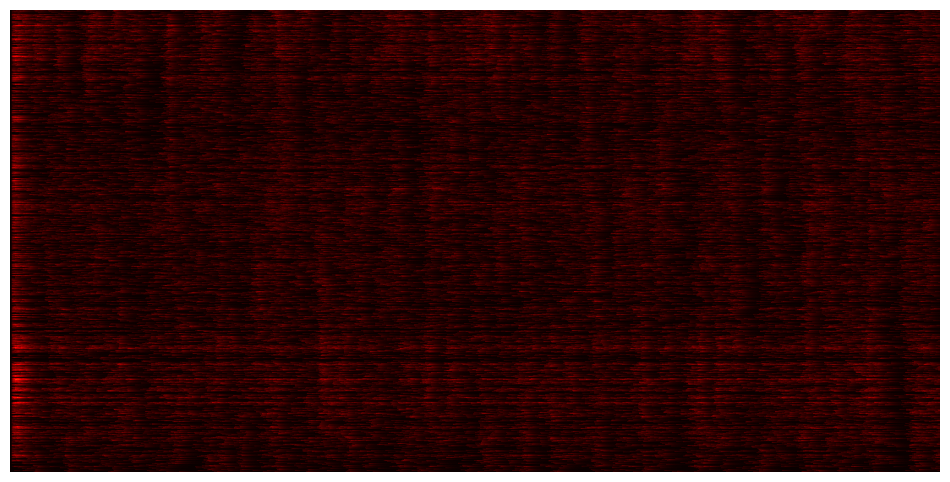

In [198]:
%matplotlib inline
simulator.imshow(vmin=0)

In [199]:
save = False
if save:
    np.save('../Results/supp_dynamics_timeseries_dynamics5.npy', simulator.timeseries)

In [202]:
%matplotlib qt
simulator.animate(alpha=1,
                  cmap='hot',
                  vmin=np.min(simulator.timeseries),
                  vmax=np.max(simulator.timeseries) * 0.75,
                  fps=50)

In [203]:
simulator.save_animation('../Figures/model5.gif', fps=50)

simulator.save_animation('../Figures/model5.gif', fps=50)

In [129]:
C = simulator.compute_average_correlations(n_iters=50, T=1100, calcium=True, tau_calcium=10, cutoff=100)

  0%|                                                    | 0/50 [00:00<?, ?it/s]/home/anleg84/anaconda3/envs/calimba/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/anleg84/anaconda3/envs/calimba/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|███████████████████████████████████████████| 50/50 [03:06<00:00,  3.74s/it]


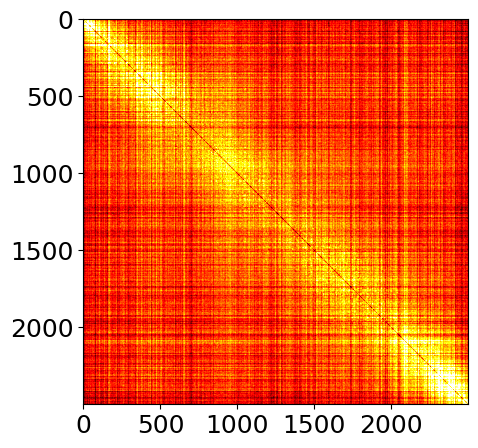

In [130]:
%matplotlib inline
plt.figure(figsize=(5, 5))
vmin, vmax = np.percentile(C, 10), np.percentile(C, 90)
plt.imshow(C, cmap='hot', vmin=vmin, vmax=vmax)

In [131]:
mode_similarity, mapping = simulator.compute_geometric_mapping(C, N_modes=20)

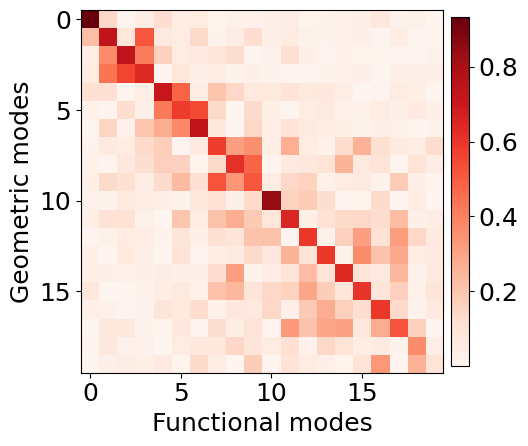

In [132]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(5, 5))
cax = plt.imshow(np.abs(mode_similarity), cmap='Reds')
plt.xlabel('Functional modes')
plt.ylabel('Geometric modes')
plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)

In [133]:
save = True
if save:
    np.save('../Results/supp_dynamics_correlations_dynamics5.npy', C)
    np.save('../Results/supp_dynamics_modesimilarity_dynamics5.npy', mode_similarity)

# Part 2: Computing over many simulations

Now, we run many simulations with each dynamical model in the optimal parameter regime to compute an average eigenmode-gradient mapping in the ellipsoid geometry.

Loading geometry

In [3]:
vertices = np.load('../Files/vertices_ellipse.npy').astype('float')
eigenmodes = np.load('../Files/eigenmodes_ellipse.npy')

ellipse = Geometry(vertices, eigenmodes)

Setting up dynamical parameters

In [4]:
# Chaotic RNN
params1 = {'N_neurons': 1500,
          'h': 0.1,
          'gamma': 27.5,
          'g': 5,
          'tau': 3,
          'dale': False,
          'rule': 'EDR'
          }

# Adjusted chaotic RNN + Dale's law
params2 = {'N_neurons': 1500,
          'h': 0.1,
          'g': 5,
          'tau': 3,
          'x_s': 0.1,
          'dale': True,
          'g_I': 1,
          'rule': 'EDR',
          'gamma': 27.5
          }

# Kuramoto-Sakaguchi
params3 = {'N_neurons': 1500,
          'h': 0.1,
          'coupling': 4000,
          'tau': 20,
          'alpha': 0,
          'std': 0.1,
          'gamma': 27.5,
          'rule': 'EDR'
          }

# Binary propagation
params4 = {'N_neurons': 2500,
          'h': 0.1,
          'P_activation': 0.18,
          'P_deactivation': 0.45,
          'rule': 'EDR',
          'gamma': 27.5
          }

# LIF
params5 = {'N_neurons': 2500,
         'h': 0.1,
         'gamma': 25,
         'g_L': 0.15,
         'E_L': -75,
         'E_E': -40,
         'E_I': -90,
         'V_thresh':-55,
         'V_reset':-75,
         'tau': 0.1,
         'I_E': 5,
         'I_I': 2.5,
         'sigma_E': 0,
         'sigma_I': 0,
         'delta_t': 0.04,
         'alpha': 2,
         'rule': 'EDR'
         }

dynamics_list = [ChaoticRNN, AdjustedChaoticRNN, KuramotoSakaguchi, BinaryNetwork, LIFNetwork]
params_list = [params1, params2, params3, params4, params5]
calcium = [False, False, False, False, True]
cutoff = [0, 0, 0, 0, 100]

In [5]:
N_replicates = 10
N_averages = 50
T = 1000
N_modes = 20

mapping_matrices = [[], [], [], [], []]
r_geometric_scores = [[], [], [], [], []]
corrdist_curves_avg = [[], [], [], [], []]
corrdist_curves_std = [[], [], [], [], []]
corr_dist_correlation = [[], [], [], [], []]

for _ in tqdm(range(N_replicates)):
    for i in range(len(dynamics_list)):
    
        # Initializing simulator
        simulator = Simulator(ellipse,
                              dynamics_list[i],
                              params_list[i])
    
        # Running multiple simulations to generate average correlation matrix
        C = simulator.compute_average_correlations(n_iters=N_averages,
                                                   T=T,
                                                   calcium=calcium[i],
                                                   tau_calcium=10,
                                                   verbose=False,
                                                   cutoff=cutoff[i])
    
        # Computing stuff from average correlation matrix C
        mode_similarity, _ = simulator.compute_geometric_mapping(C, N_modes=N_modes)
        r_geometric = np.mean(np.diag(np.abs(mode_similarity)))
        _, curve_avg, curve_std = simulator.compute_correlation_curve(C, d_max=0.5)

        d = compute_distances(simulator.coordinates, simulator.coordinates)
        triangle = np.triu_indices(d.shape[0], 1)

        mapping_matrices[i].append(mode_similarity)
        r_geometric_scores[i].append(r_geometric)
        corrdist_curves_avg[i].append(curve_avg)
        corrdist_curves_std[i].append(curve_std)
        corr_dist_correlation[i].append(pearsonr(C[triangle], d[triangle])[0])

  0%|                                                    | 0/10 [00:00<?, ?it/s]/home/anleg84/GitHub/geometric-networks/Notebooks/../main.py:637: RuntimeWarning: divide by zero encountered in scalar divide
  ratio = E / I
/home/anleg84/GitHub/geometric-networks/Notebooks/../main.py:637: RuntimeWarning: invalid value encountered in scalar divide
  ratio = E / I
/home/anleg84/anaconda3/envs/calimba/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/anleg84/anaconda3/envs/calimba/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|██████████████████████████████████████████| 10/10 [39:46<00:00, 238.63s/it]


In [6]:
np.save('../Results/supp_dynamics_matrices.npy', mapping_matrices)
np.save('../Results/supp_dynamics_r_geometric.npy', r_geometric_scores)
np.save('../Results/supp_dynamics_corrdist_avg.npy', corrdist_curves_avg)
np.save('../Results/supp_dynamics_corrdist_std.npy', corrdist_curves_std)
np.save('../Results/supp_dynamics_corrdist_relationship.npy', corr_dist_correlation)

# Part 3: Rendering figure

Now we load the results and render the supplementary figure.

In [7]:
from visualization import *
import matplotlib.ticker as ticker

In [8]:
timeseries, correlations, mode_similarity = [], [], []

for i in range(5):
    timeseries.append(np.load(f'../Results/supp_dynamics_timeseries_dynamics{i+1}.npy'))
    correlations.append(np.load(f'../Results/supp_dynamics_correlations_dynamics{i+1}.npy'))
    mode_similarity.append(np.load(f'../Results/supp_dynamics_modesimilarity_dynamics{i+1}.npy'))

timeseries[2] = timeseries[2][:, 100:] # Removing dynamics onset
timeseries[4] = timeseries[4][:, 100:] # Removing dynamics onset

mapping_matrices = np.load('../Results/supp_dynamics_matrices.npy')
r_geometric_scores = np.load('../Results/supp_dynamics_r_geometric.npy')
corrdist_curves_avg = np.load('../Results/supp_dynamics_corrdist_avg.npy')
corrdist_curves_std = np.load('../Results/supp_dynamics_corrdist_std.npy')
corr_dist_correlation = np.load('../Results/supp_dynamics_corrdist_relationship.npy')

In [9]:
den = 300

colors = [[1, 0, 0],
         [178/den, 161/den, 255/den],
         [44/den, 166/den, 255/den],
         [47/den, 216/den, 180/den],
         [255/den, 183/den, 0/den]]

ylim = [[0.1, 0.30],
       [0.05, 0.50],
       [0.07, 0.80],
       [0.03, 0.15],
       [0.03, 0.4]]

In [10]:
cmaps = []
for c in colors:
    cmaps.append(make_cmap([[1, 1, 1], c], [0, 1]))

In [11]:
from scipy.stats import zscore

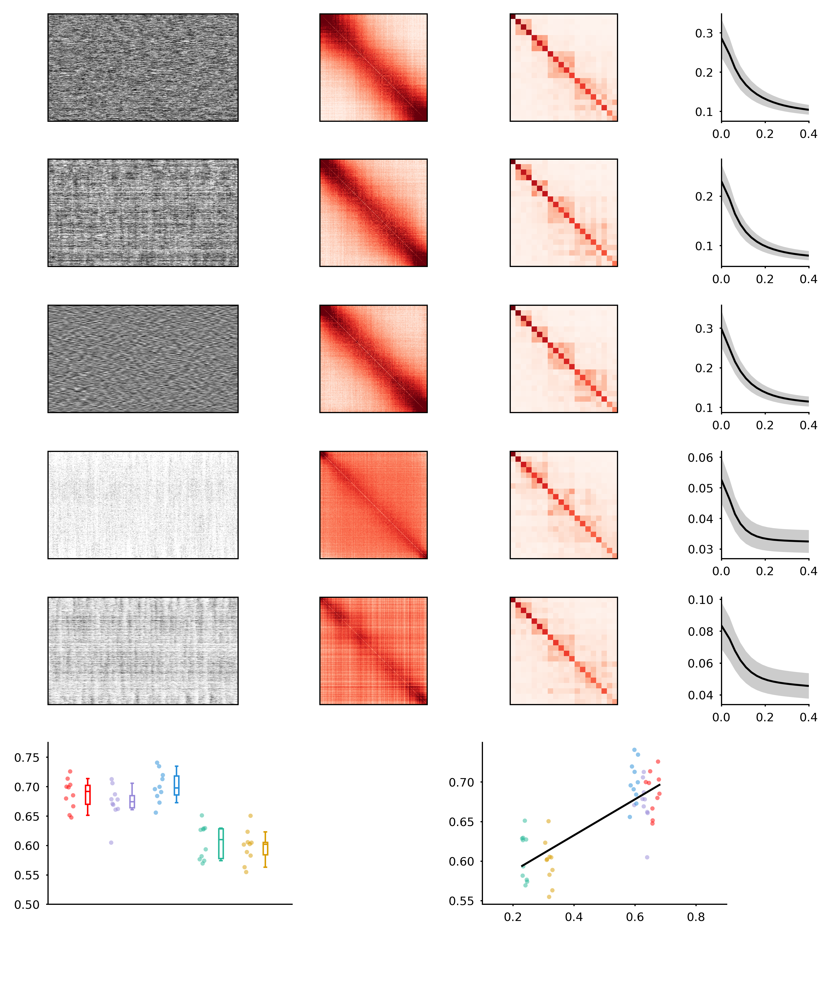

In [19]:
fig = PaperFigure(figsize=(7, 9), dpi=600)

fig.set_tick_length(1)
fig.set_font_size(6)
fig.add_background()

# Adding panels -------------------------------

w = 1
ratio = 1.75
pad = (7 - (ratio + 3) * w) / 3
ypad = 0.35

for i in range(5):
    fig.add_axes(f'timeseries{i}', (0, i * (w + ypad)), ratio * w, w)
    fig.add_axes(f'correlations{i}', (ratio * w + pad, i * (w + ypad)), w, w)
    fig.add_axes(f'mapping{i}', ((1 + ratio) * w + 2 * pad, i * (w + ypad)), w, w)
    fig.add_axes(f'corrdist{i}', (6.2, i * (w + ypad)), w, w)

fig.add_axes('barchart', (0, 5 * (w + ypad)), 2.25, 1.5 * w)
fig.add_axes('scatter', (4, 5 * (w + ypad)), 2.25 * w, 1.5 * w)


fig.set_line_thickness(0.6)

# Content -------------------------------------

for i in range(5):
    
    ax = fig.axes[f'timeseries{i}']
    vmin = np.percentile(timeseries[i], 5)
    vmax = np.percentile(timeseries[i], 95)
    ax.imshow(timeseries[i], cmap='binary', aspect='auto', vmin=vmin, vmax=vmax)
    #ax.imshow(zscore(timeseries[i], axis=1), cmap='binary', aspect='auto', vmin=-1, vmax=1)
    ax.set_xticks([])
    ax.set_yticks([])

    ax = fig.axes[f'correlations{i}']
    vmin = np.percentile(correlations[i], 10)
    vmax = np.percentile(correlations[i], 90)
    ax.imshow(correlations[i], cmap='Reds', vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])

    ax = fig.axes[f'mapping{i}']
    ax.imshow(np.mean(np.abs(mapping_matrices[i]), axis=0), cmap='Reds', vmin=0, vmax=1)
    #ax.imshow(np.abs(mode_similarity[i]), cmap='Reds', vmin=0, vmax=1)
    ax.set_xticks([])
    ax.set_yticks([])

    ax = fig.axes[f'corrdist{i}']
    bins = np.linspace(0, 0.5, 21, endpoint=True)
    d = bins[:-1] + (np.diff(bins) / 2)
    d[0] = 0
    curve_avg = np.mean(corrdist_curves_avg[i], axis=0)
    curve_std = np.mean(corrdist_curves_std[i], axis=0)
    ax.plot(d, curve_avg, color='black', linewidth=1)
    ax.fill_between(d, curve_avg - curve_std, curve_avg + curve_std, color='black', alpha=0.2, edgecolor=None)
    ax.spines[['top', 'right']].set_visible(False)
    #ax.axvline(0.1, color='black', linewidth=0.5, linestyle='--')
    ax.set_xlim([0, 0.4])
    #ax.set_ylim([ylim[i][0], ylim[i][1]])
    #ax.set_yticks([ylim[i][0], ylim[i][1]])

ax = fig.axes['barchart']
for i in range(5):
    ax.scatter(np.random.uniform(i-0.1, i+0.1, len(r_geometric_scores[i])), r_geometric_scores[i], color=colors[i], edgecolor='None', s=5, alpha=0.5)
    bp = ax.boxplot(r_geometric_scores[i], positions=[i + 0.4], patch_artist=True, widths=0.1, whis=[5, 95])
    set_boxplot_color(bp, colors[i], marker='None', linewidth=0.75)
ax.set_xlim([-0.5, 5])
ax.set_ylim([0.5, 0.775])
ax.set_xticks([])
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['scatter']
colors_scatter = [colors[0]] * 10 + [colors[1]] * 10 + [colors[2]] * 10 + [colors[3]] * 10 + [colors[4]] * 10
x = np.concatenate(np.abs(corr_dist_correlation))
y = np.concatenate(r_geometric_scores)
a, b = np.polyfit(x, y, 1)
ax.scatter(np.concatenate(np.abs(corr_dist_correlation)), np.concatenate(r_geometric_scores), color=colors_scatter, alpha=0.5, s=5, edgecolor='None')
x = np.linspace(np.min(np.abs(corr_dist_correlation)), np.max(np.abs(corr_dist_correlation)), 30)
ax.plot(x, a * x + b, color='black', linewidth=1)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([0.1, 0.9])
#ax.set_ylim([0.35, 0.775])

# Displaying ----------------------------------

fig.show()

In [20]:
fig.save('../Figures/supp_dynamics_incomplete.svg')

#### Manually written values

Correlation values

In [17]:
for c in correlations:
    vmin = np.percentile(c[i], 10)
    vmax = np.percentile(c[i], 90)
    print(vmin, vmax)

0.08501268277818144 0.14780461221226868
0.06483464163207099 0.10415828870665429
0.09763600949146893 0.142975933631009
0.02619061727405278 0.0368432605067719
0.03299645181316341 0.0508210486072125


Statistical test (One-way ANOVA)

In [14]:
groups_ANOVA_Tukey(r_geometric_scores)

ANOVA results: F = 29.128363213660077, p = 5.609195789913195e-12

 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1  group2 meandiff p-adj   lower   upper  reject
------------------------------------------------------
Group 1 Group 2  -0.0142 0.7872 -0.0498  0.0214  False
Group 1 Group 3   0.0135  0.817 -0.0221   0.049  False
Group 1 Group 4  -0.0814    0.0 -0.1169 -0.0458   True
Group 1 Group 5  -0.0894    0.0  -0.125 -0.0539   True
Group 2 Group 3   0.0277 0.1938 -0.0079  0.0632  False
Group 2 Group 4  -0.0672    0.0 -0.1027 -0.0316   True
Group 2 Group 5  -0.0752    0.0 -0.1108 -0.0397   True
Group 3 Group 4  -0.0949    0.0 -0.1304 -0.0593   True
Group 3 Group 5  -0.1029    0.0 -0.1385 -0.0674   True
Group 4 Group 5  -0.0081 0.9669 -0.0436  0.0275  False
------------------------------------------------------


Linear regression

In [15]:
x = np.concatenate(np.abs(corr_dist_correlation))
y = np.concatenate(r_geometric_scores)
pearsonr(x, y)

(0.793375232922638, 6.413382085538874e-12)